# First attempt at analysis neurons

## Bibliography
- https://www.pyimagesearch.com/2014/09/15/python-compare-two-images/
- https://www.pyimagesearch.com/2017/06/19/image-difference-with-opencv-and-python/
- https://www.pyimagesearch.com/2016/10/31/detecting-multiple-bright-spots-in-an-image-with-python-and-opencv/
- http://www.ecse.rpiscrews.us/~rjradke/papers/radketip04.pdf
- https://ascimaging.springeropen.com/articles/10.1186/s40679-016-0031-0
- http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_filtering/py_filtering.html
- https://docs.opencv.org/3.1.0/d5/daf/tutorial_py_histogram_equalization.html
- **http://www.ecse.rpiscrews.us/~rjradke/papers/radketip04.pdf**
- http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.330.202&rep=rep1&type=pdf
- http://scikit-image.org/docs/dev/auto_examples/features_detection/plot_blob.html
- https://arxiv.org/pdf/1705.02949.pdf
- https://hal.archives-ouvertes.fr/hal-00527382/document
- https://www.irisa.fr/vista/Papers/2005_ijcv_laptev.pdf
- http://theses.insa-lyon.fr/publication/2003ISAL0089/these.pdf

In [1]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt
from PIL import Image
from scipy import ndimage
from skimage import io
import matplotlib.animation as animation
import skimage as sk

In [2]:
images_names = [n for n in os.listdir('.') if n.endswith('tif')]
np.sort(images_names)

array(['GAERSDIV4_1_3.tif', 'WistarDIV4_3_3.tif', 'WistarDIV4_3_4.tif'],
      dtype='<U18')

In [3]:
# im = cv2.imread('GAERSDIV4_1_3.tif', 0)

In [4]:
# plt.imshow(im)

In [5]:
# DEPRECIATED - USE skimage.io

# def load_tiff_as_numpy(filename):
    
#     file = Image.open(filename)
#     data = []
    
#     try:
#         file.seek(0)
#         image = list(file.getdata())
#         size = np.sqrt(len(image)).astype('int')
#         data.append(np.reshape(image, (size,size)))
#     except ValueError:
#         print("There is no image in this file")
        
#     i = 1
#     while(i>-1):
#         try:
#             file.seek(i)
#             image = list(file.getdata())
#             data.append(np.reshape(image, (size,size)))
#             i+=1
#         except:
#             print("{} image".format(i))
#             break
#     return np.array(data)

In [6]:
# def my_vis(img, n=10):
#     for i in range(n):
#         img.seek(i)
#         data = np.array(list(img.getdata()))
#         plt.imshow(data.reshape((1024,1024)), cmap='gray')
#         plt.show()

In [7]:
# def diff_img(img, nmax=10):
#     img.seek(0)
#     diff_dict = []
#     ref = np.array(list(img.getdata()), dtype='int8')
#     for i in range(1, nmax):
#         try:
#             img.seek(i)
#         except:
#             break
#         data = np.array(list(img.getdata()), dtype='int8')
#         diff = data - ref
#         diff_dict.append(diff)
#         #plt.imshow(diff.reshape((1024,1024)), cmap='gray')
#         # plt.show()
#     return np.array(diff_dict)

In [8]:
def show_image(image, figsize=(12,12)):
    plt.figure(figsize=figsize)
    plt.imshow(image, cmap='gray')

In [9]:
def calibrate_video(video):
    """
    calibrate each image by removing median to each pixel
    3D numpy array
    """
    med = np.median(video, axis=(1,2))
    return video - med[:,None,None]

In [10]:
def threshold_video(video, threshold):
    """
    apply a threshold to each video frame
    3D numpy array
    """
    n = copy(video)
    n[n<threshold] = threshold
    return n

In [11]:
def grid_view(video, **kwargs):
    nrow = len(video)//3+1*(len(video)%3>0)
    fig, axes = plt.subplots(nrow, 3,
                            figsize=(15,5*nrow))
    
    for i, im in enumerate(video):
        axes.flatten()[i].imshow(im, **kwargs)
    
    return axes

In [12]:
def display_video(video, figsize=(8,8), **kwargs):
    
    %matplotlib notebook
    
    fig = plt.figure(figsize=figsize)

    # ims is a list of lists, each row is a list of artists to draw in the
    # current frame; here we are just animating one artist, the image, in
    # each frame
    ims = []

    for v in video:
        im = plt.imshow(v, animated=True, **kwargs)
        ims.append([im])

    ani = animation.ArtistAnimation(fig, ims, interval=40, blit=True,
                                    repeat_delay=100)

    # ani.save('dynamic_images.mp4')

    # plt.show()
    return ani

## Load the files

In [13]:
# img = Image.open('WistarDIV4_3_4.tif')

In [14]:
video = io.imread('WistarDIV4_3_4.tif')

In [15]:
# video = load_tiff_as_numpy( "WistarDIV4_3_4.tif")

In [16]:
print("There are {0} images of {1}x{2} pixels".format(video.shape[0], video.shape[1], video.shape[2]))

There are 70 images of 1024x1024 pixels


### transform into numpy array for convienence

In [17]:
# imgnp = img_to_numpy(img)

### quick view

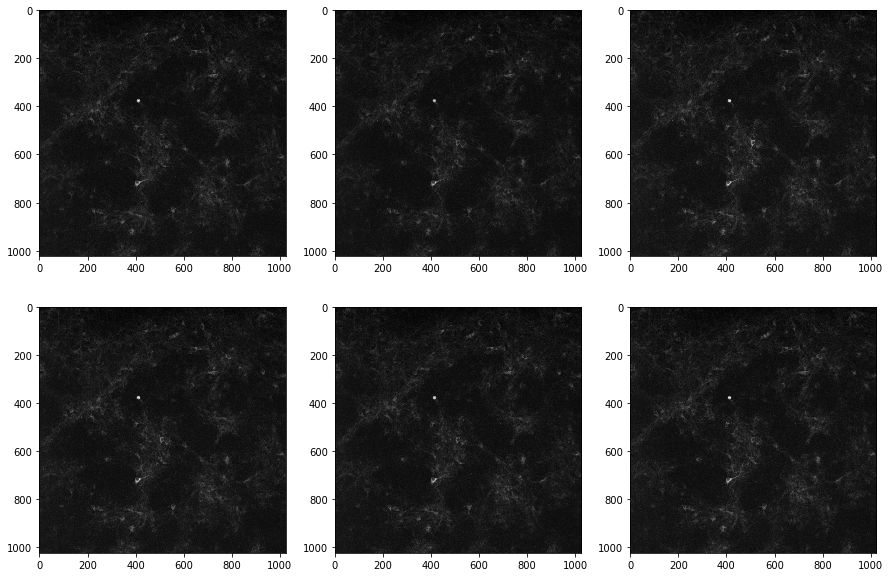

In [18]:
grid_view(video[15:21], cmap='gray');

## display video

<IPython.core.display.Javascript object>


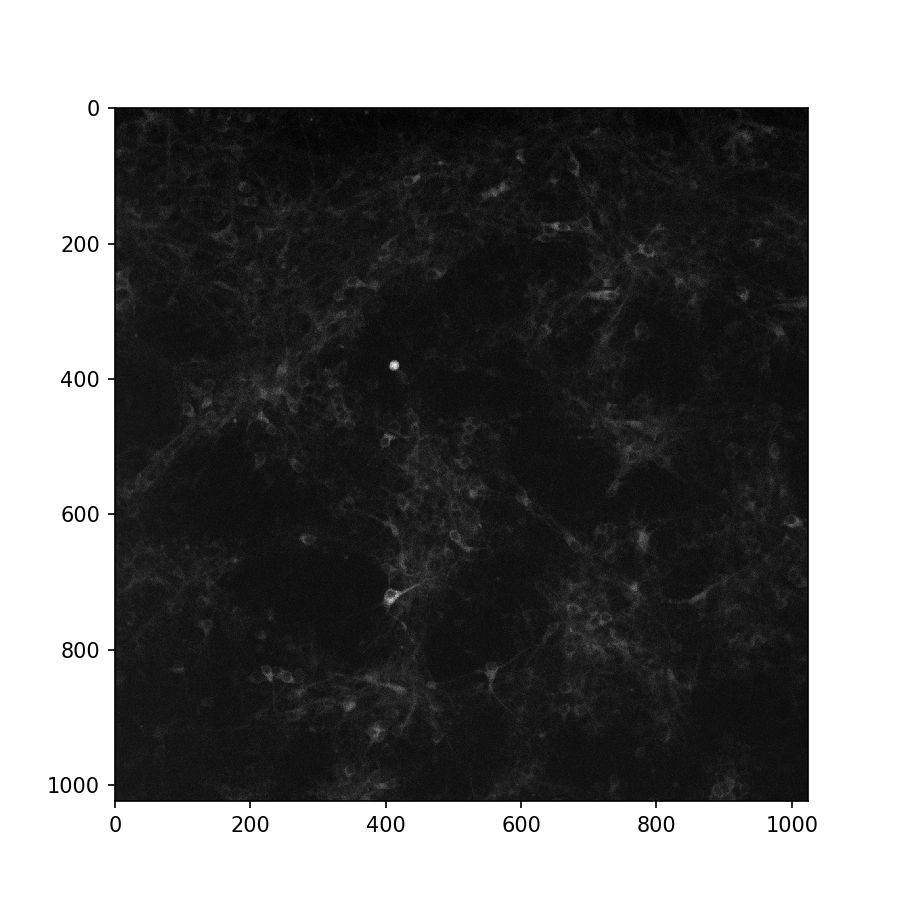

In [19]:
display_video(video, figsize=(6,6), cmap='gray')

**Kill it after seeing it to save memory**

### Calibration

It seems that there is a constant decrease of the signal median in time.   
This might be due to the camera calibration, or just the light decreasing ??

<IPython.core.display.Javascript object>


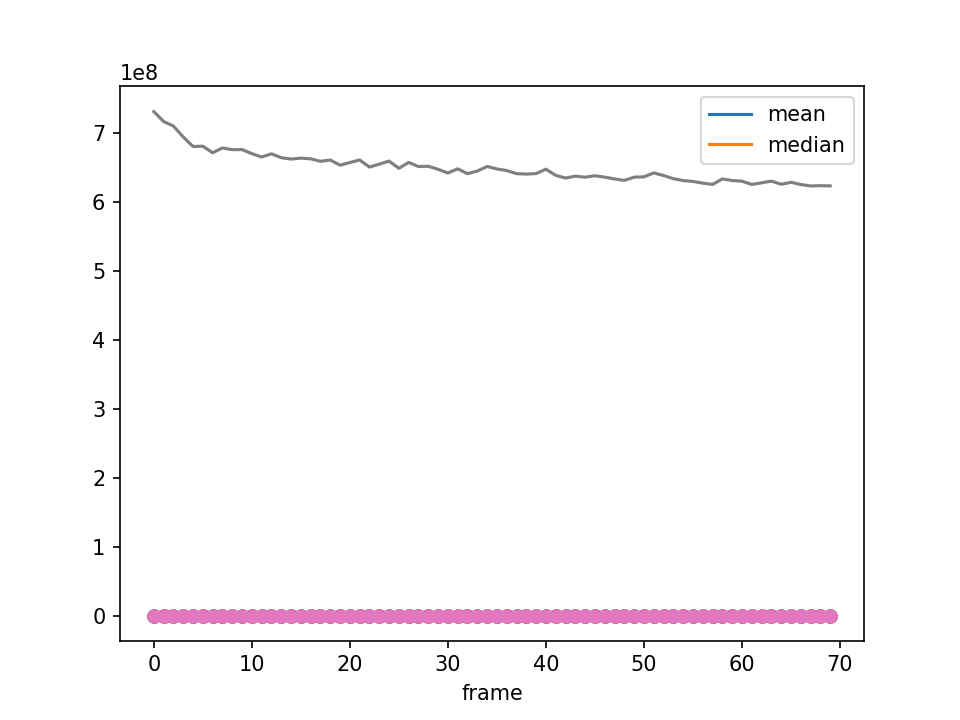

In [20]:
plt.plot(video.mean(axis=(1,2)), label="mean")
plt.plot(np.median(video, axis=(1,2)), label="median")
plt.xlabel("frame")
plt.legend()

I chose to recalibrate the images by correcting for this decrease

In [33]:
cal = calibrate_video(video)
cal.shape

(70, 1024, 1024)

In [34]:
plt.plot(np.median(cal, axis=(1,2)));

### compute the difference between each frame and a reference frame

In [35]:
# here reference is first frame
diff = cal - cal[0]

In [36]:
%matplotlib inline

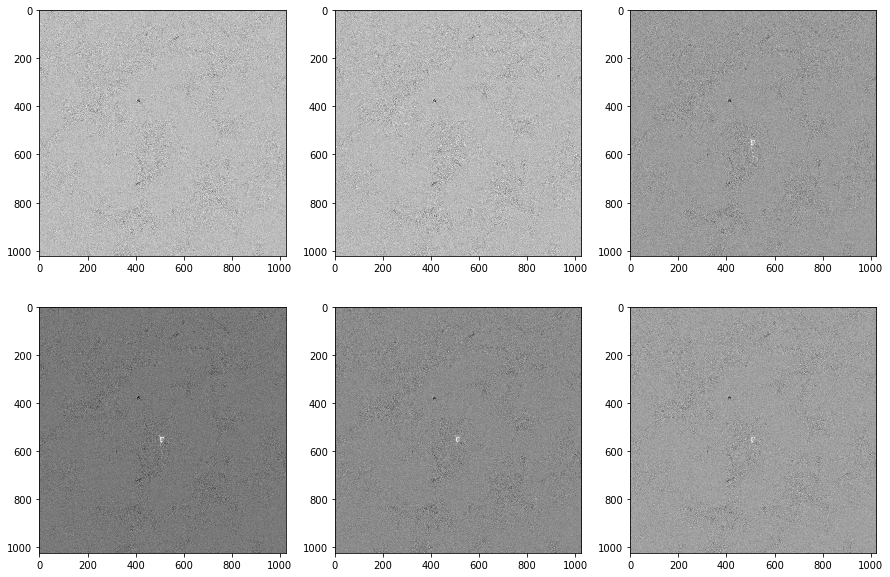

In [37]:
grid_view(diff[14:20], cmap='gray');

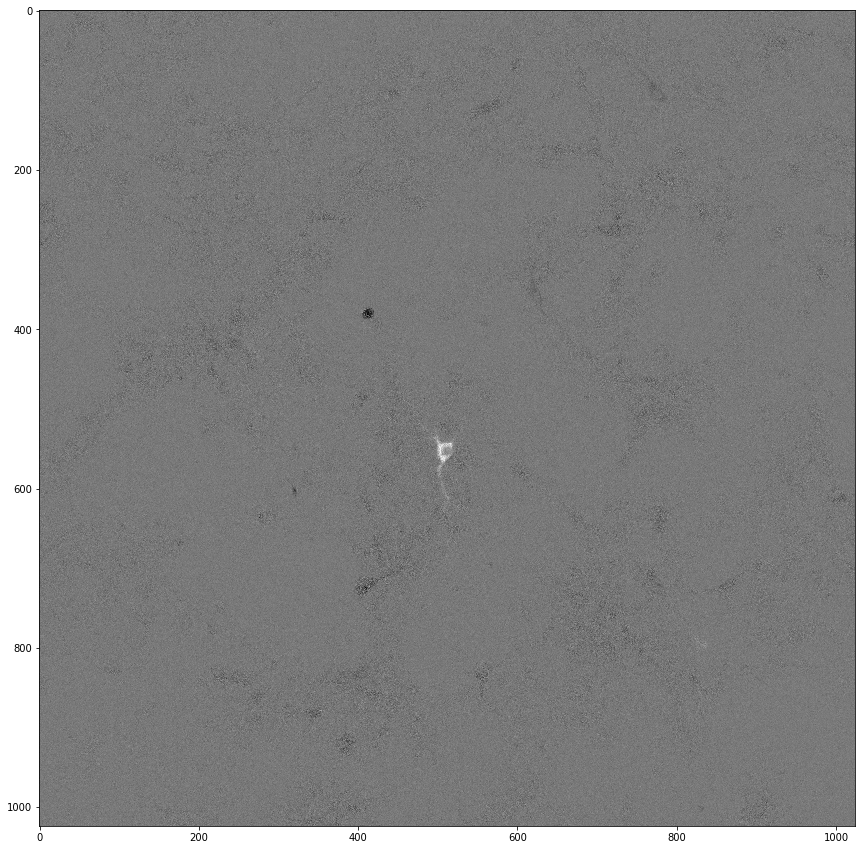

In [38]:
plt.figure(figsize=(15,15))
plt.imshow(diff[17], cmap='gray')

### Normalize

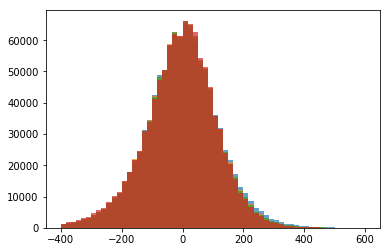

In [39]:
for d in diff[[1,10,20,30]]:
    plt.hist(d.flatten(), range=(-400, 600), bins=60, alpha=0.7)

In [40]:
normed = np.nan_to_num(255 * (diff - diff.min()) / (diff.max() - diff.min()))

29.50166420118343 34.782729289940825


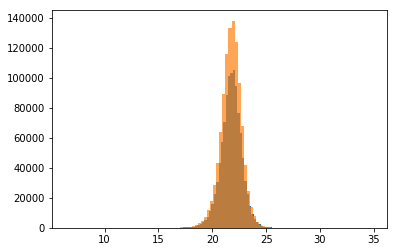

In [41]:
# plt.hist(normed[1], bins=100);
# plt.hist(normed[2], bins=100);
plt.hist(normed[3].flatten(), bins=100);
plt.hist(normed[18].flatten(), bins=100, alpha=0.7);
print(normed[3].max(), normed[18].max())

In [42]:
# grid_view(diff[14:20], cmap='gray');

### Apply some image cleaning

In [64]:
normed.shape

(70, 1024, 1024)

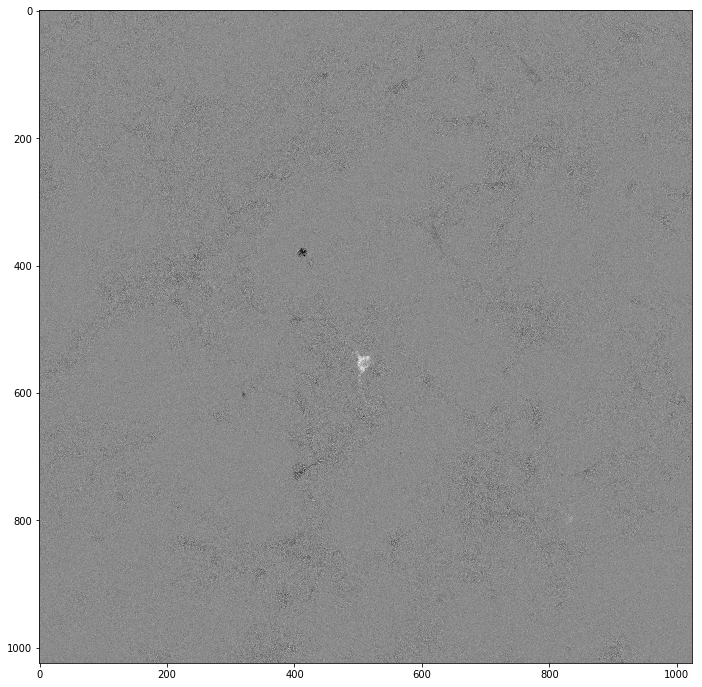

In [65]:
show_image(normed[18])

In [66]:
def blur(image):
    return cv2.GaussianBlur(image.astype('float32'), (11, 11), 0)

In [67]:
blurred = np.array(list(map(blur, normed)))

In [68]:
# blurred = cv2.GaussianBlur(im.astype('float32'), (11, 11), 0)
thresh = np.array([cv2.threshold(b, 23, 255, cv2.THRESH_BINARY)[1] for b in blurred])
thresh = np.array([cv2.erode(t, None, iterations=1) for t in thresh])
thresh = np.array([cv2.dilate(t, None, iterations=1) for t in thresh])

In [69]:
thresh.shape

(70, 1024, 1024)

In [70]:
blurred.mean(), np.median(blurred), np.percentile(blurred,90)

(21.738068, 21.79309, 21.981735229492188)

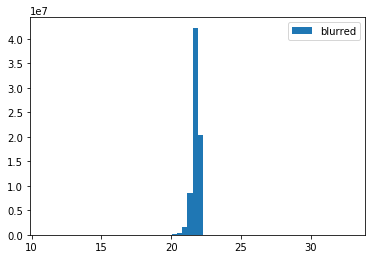

In [71]:
# plt.hist(normed.flatten(), bins=60, normed=True);
plt.hist(blurred.flatten(), bins=60, label="blurred");
# plt.hist(thresh.flatten(), bins=60);
plt.legend()

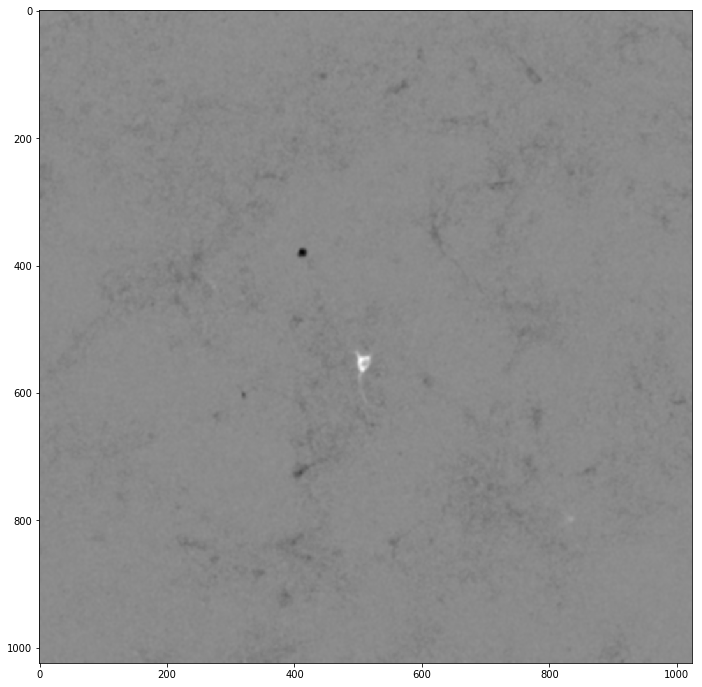

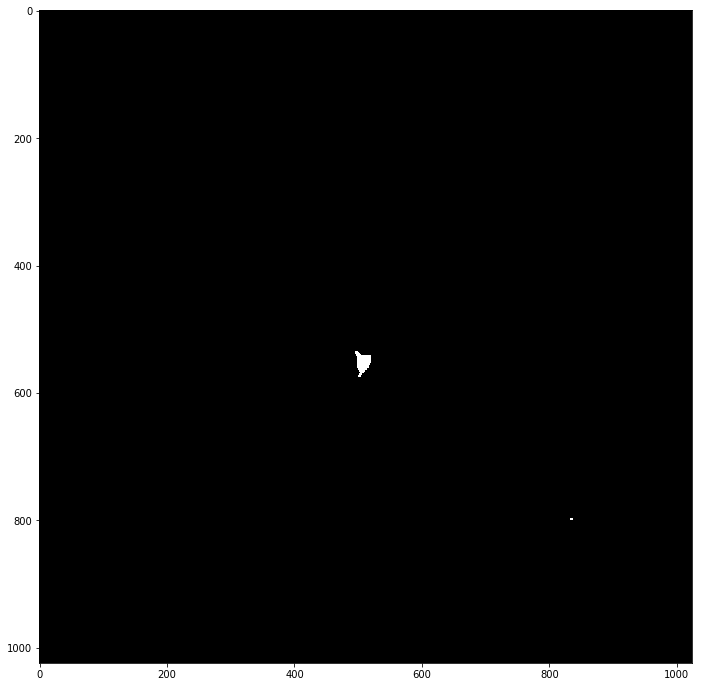

In [72]:
show_image(blurred[18])
plt.show()
show_image(thresh[18])

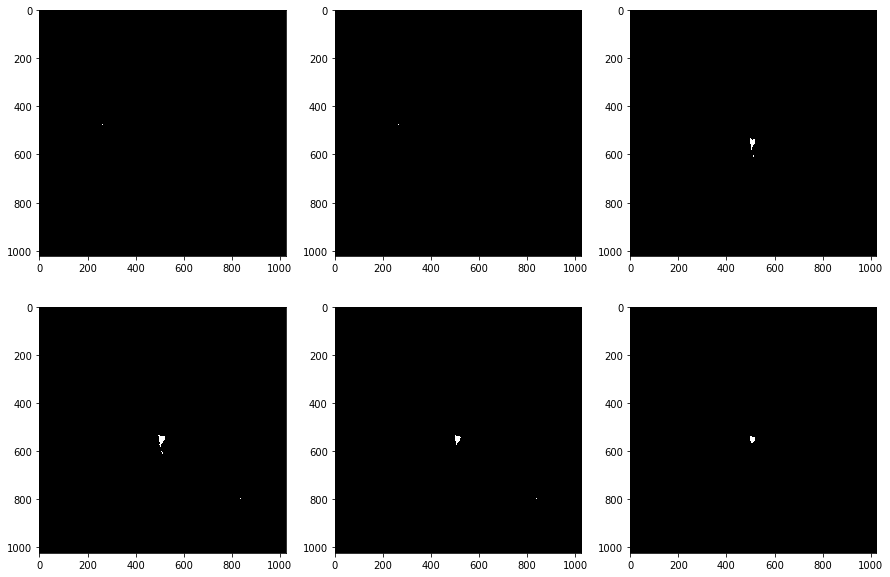

In [73]:
grid_view(thresh[14:20], cmap='gray');

Text(0,0.5,'signal')

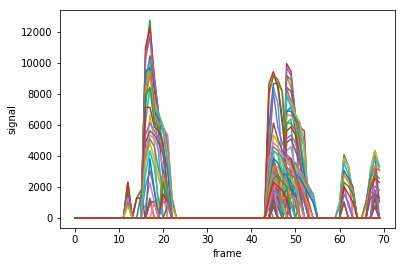

In [74]:
plt.plot(thresh.sum(axis=1))
plt.xlabel("frame")
plt.ylabel("signal")

Text(0,0.5,'number of pixels')

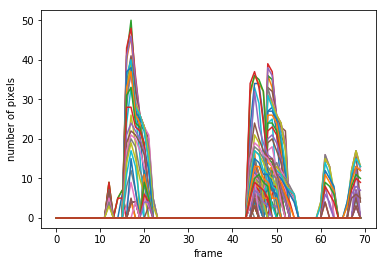

In [75]:
plt.plot(thresh.sum(axis=1)/255)
plt.xlabel("frame")
plt.ylabel("number of pixels")

In [76]:
from skimage import measure

In [77]:
def mask_blob(image, minPixel=30):

    # image = thresh[-1].reshape(1024, 1024)

    # perform a connected component analysis on the thresholded
    # image, then initialize a mask to store only the "large"
    # components
    labels = measure.label(image, neighbors=8, background=0)
    mask = np.zeros(image.shape, dtype="uint8")

    # loop over the unique components
    for label in np.unique(labels):
        # if this is the background label, ignore it
        if label == 0:
            continue

        # otherwise, construct the label mask and count the
        # number of pixels 
        labelMask = np.zeros(image.shape, dtype="uint8")
        labelMask[labels == label] = 255
        numPixels = cv2.countNonZero(labelMask)

        # if the number of pixels in the component is sufficiently
        # large, then add it to our mask of "large blobs"
        if numPixels > 30:
            mask = cv2.add(mask, labelMask)
            
    return mask

In [78]:
mask = mask_blob(thresh[-1].reshape(1024,1024))

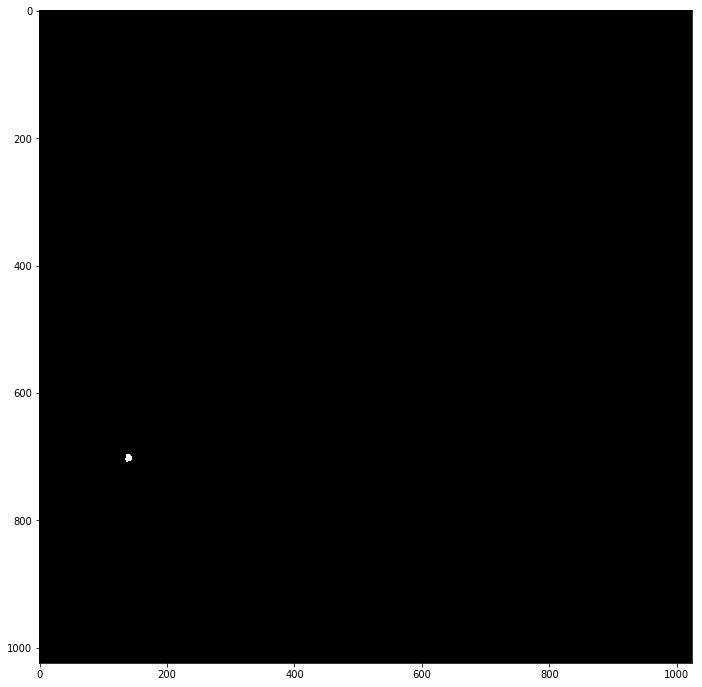

In [79]:
show_image(thresh[-1])

In [80]:
mask.shape

(1024, 1024)

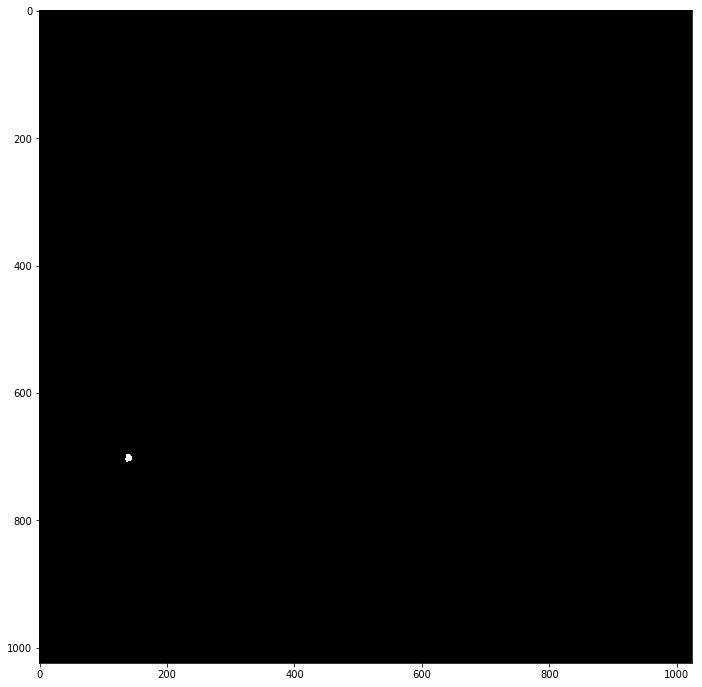

In [81]:
show_image(mask)

In [82]:
import imutils 
from imutils import contours

In [83]:
def show_contours_blob(image, mask, figsize=(14,14)):

    cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if imutils.is_cv2() else cnts[1]
    cnts = contours.sort_contours(cnts)[0]

    # loop over the contours


    # show the output image

    fig,ax = plt.subplots(1, figsize=figsize)
    ax.set_aspect('equal')

    # Show the image
    ax.imshow(image, cmap='gray')

    # ax = plt.imshow(image, cmap='gray')
    for (i, c) in enumerate(cnts):
        # draw the bright spot on the image
        (x, y, w, h) = cv2.boundingRect(c)
        ((cX, cY), radius) = cv2.minEnclosingCircle(c)
        # circle = plt.Circle((int(cX), int(cY)), radius=10*radius,  color='red')
        # ax.add_patch(circle)
        ax.scatter(cX, cY, s=radius*100, facecolors='none', edgecolors='r')

        # cv2.circle(image, (int(cX), int(cY)), int(radius), (0, 0, 255), 3)
        # cv2.putText(image, "#{}".format(i + 1), (x, y - 15),
        #     cv2.FONT_HERSHEY_SIMPLEX, 0.45, (0, 0, 255), 2)

    # cv2.imshow("Image", image)
    # cv2.waitKey(0)

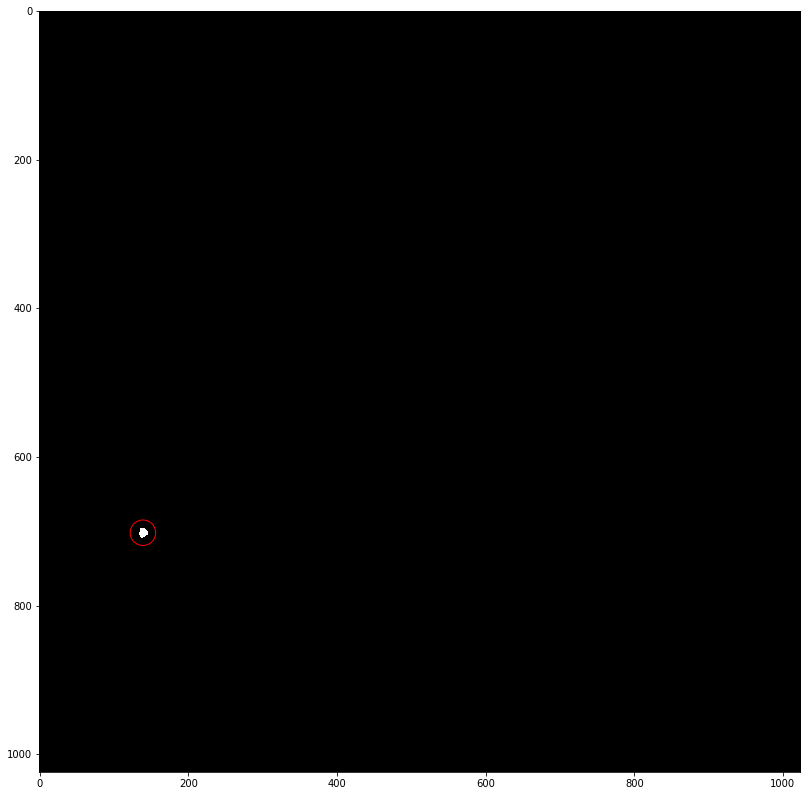

In [84]:
show_contours_blob(thresh[-1], mask, figsize=(14,14))

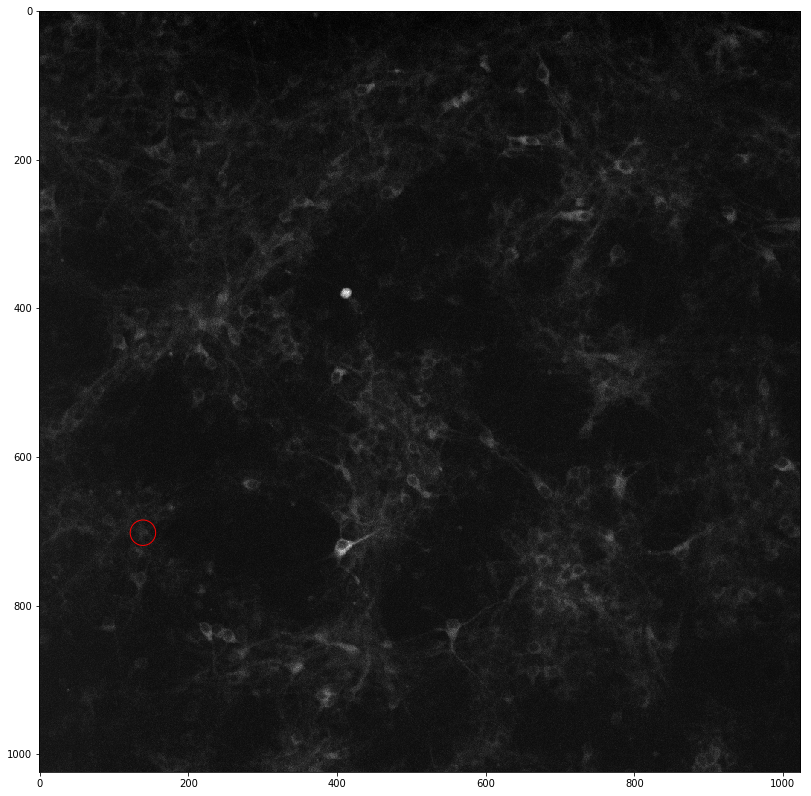

In [85]:
show_contours_blob(video[-1], mask, figsize=(14,14))

In [86]:
image = thresh[48]
mask = mask_blob(image)
# 

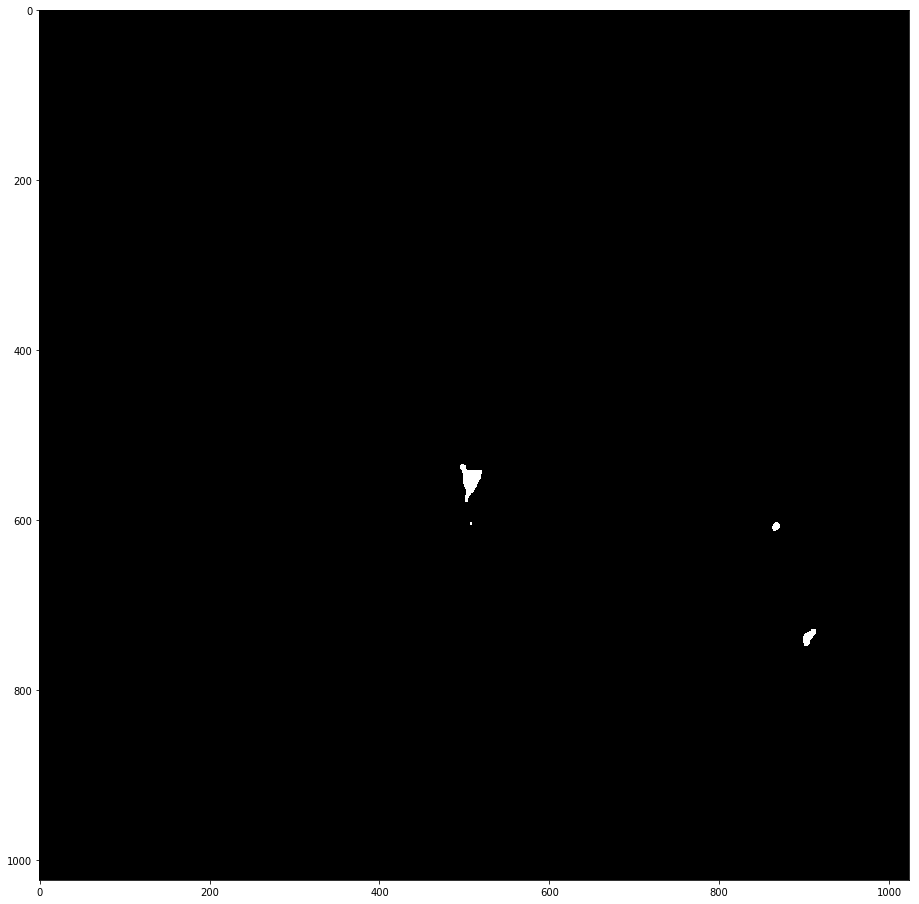

In [87]:
show_image(image, figsize=(16,16))

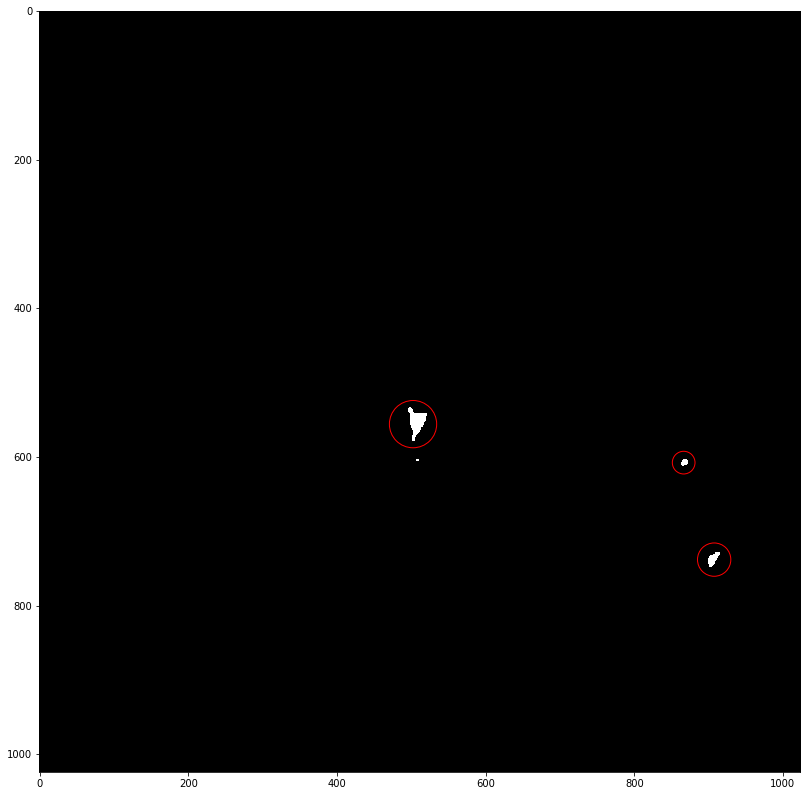

In [88]:
show_contours_blob(image, mask)

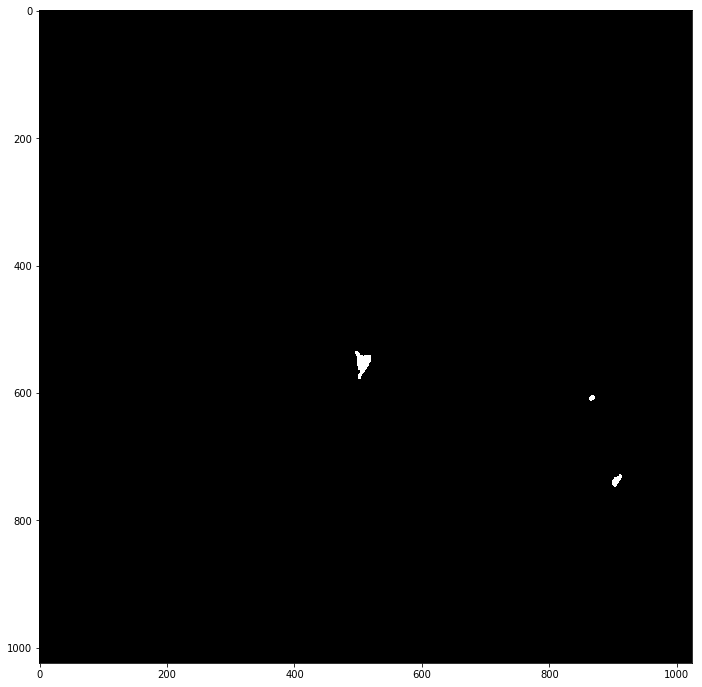

In [89]:
show_image(mask)

In [90]:
len(np.where(mask==0))

2

In [91]:
image.shape

(1024, 1024)

In [92]:
import copy

In [93]:
image = copy.copy(video[48])
image[~mask.astype('bool')] = 255

<IPython.core.display.Javascript object>


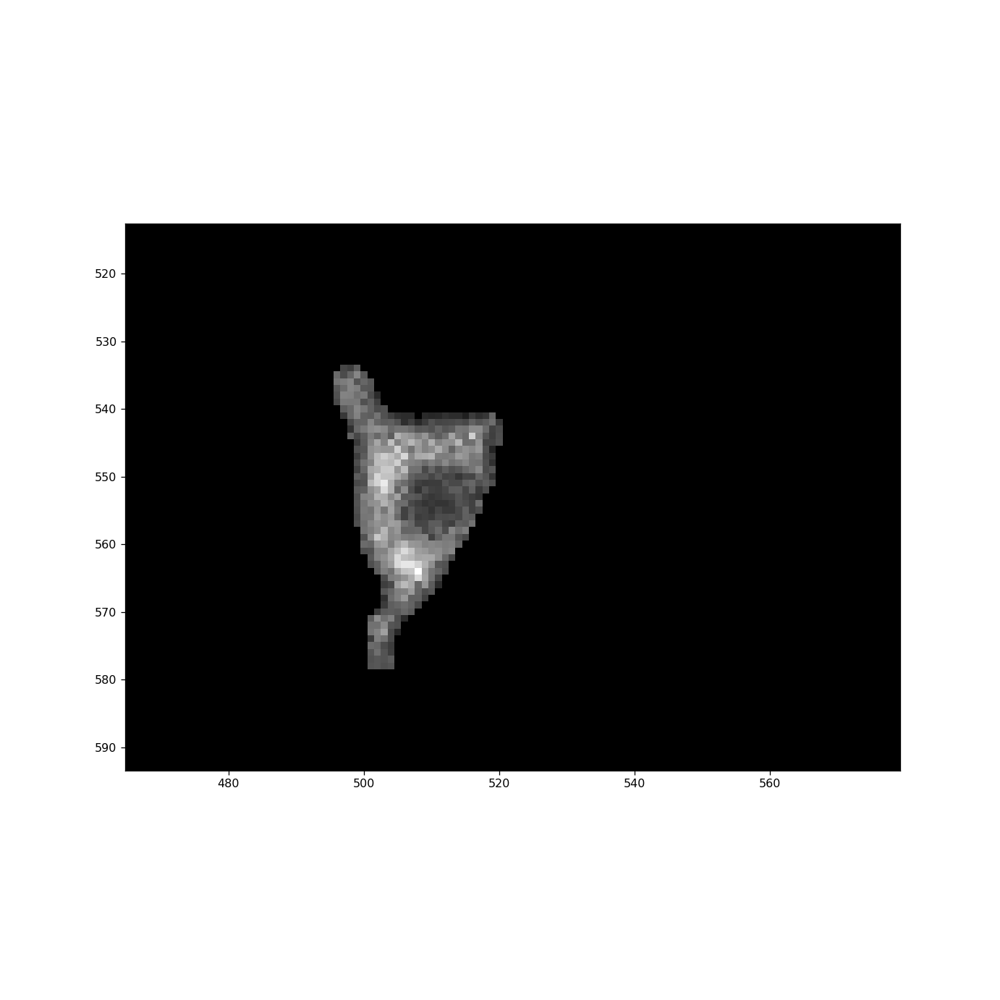

In [100]:
%matplotlib notebook
show_image(image)

In [97]:
where = np.where(mask.astype('bool'))
signal_pixels = video[:,where[0], where[1]]

In [99]:
where[0][0:10], where[0][1:10]

(array([534, 534, 534, 535, 535, 535, 535, 535, 536, 536]),
 array([534, 534, 535, 535, 535, 535, 535, 536, 536]))

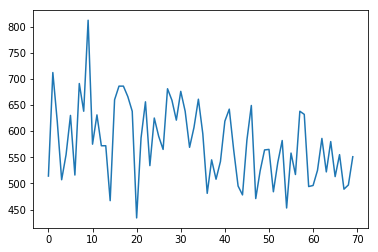

In [116]:
plt.plot(video[:,534,534])

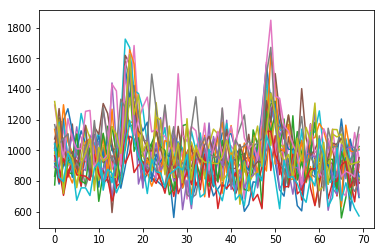

In [123]:
plt.plot(signal_pixels[:,:20]);

In [106]:
image[[0,1,2,3],[0,1,2,4]]

array([255, 255, 255, 255], dtype=uint16)

## Time evolution

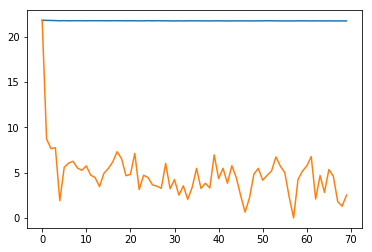

In [43]:
plt.plot(normed.mean(axis=(1,2)))
plt.plot(normed.min(axis=(1,2)))

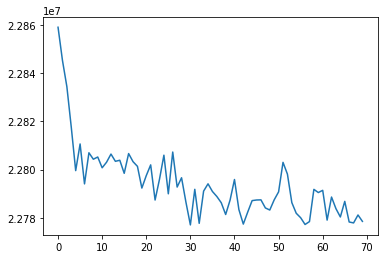

In [35]:
plt.plot(normed.sum(axis=(1,2)))

In [145]:
(mask==255).any()

True

In [122]:
cap = cv2.VideoCapture('WistarDIV4_3_4.tif')

In [123]:
import scenedetect as sd

In [124]:
sd.detect_scenes(cap)

TypeError: detect_scenes() missing 1 required positional argument: 'scene_manager'

In [125]:
manager = sd.manager.SceneManager()

TypeError: __init__() missing 2 required positional arguments: 'args' and 'scene_detectors'

In [129]:
import scenedetect

scene_list = []        # Scenes will be added to this list in detect_scenes().
path = 'WistarDIV4_3_4.tif'  # Path to video file.

# Usually use one detector, but multiple can be used.
detector_list = [
    scenedetect.detectors.ThresholdDetector(threshold = 16, min_percent = 0.9)
]

manager = sd.manager.SceneManager((16, 0.9), scenedetect.detectors.ThresholdDetector)

video_framerate, frames_read = scenedetect.detect_scenes_file(path, manager)

# scene_list now contains the frame numbers of scene boundaries.
print(scene_list)

# create new list with scene boundaries in milliseconds instead of frame #.
scene_list_msec = [(1000.0 * x) / float(video_fps) for x in scene_list]

# create new list with scene boundaries in timecode strings ("HH:MM:SS.nnn").
scene_list_tc = [scenedetect.timecodes.get_string(x) for x in scene_list_msec]


AttributeError: 'tuple' object has no attribute 'detection_method'

In [134]:
%pdb

Automatic pdb calling has been turned OFF


In [135]:
sd.manager.SceneManager?

In [133]:
manager = sd.manager.SceneManager((16, 0.9), sd.detectors.ThresholdDetector)


AttributeError: 'tuple' object has no attribute 'detection_method'

> /Users/thomasvuillaume/anaconda/envs/school18/lib/python3.6/site-packages/PySceneDetect-0.3.6-py3.6.egg/scenedetect/manager.py(55)__init__()
     53         # Load SceneDetector with proper arguments based on passed detector (-d).
     54         self.detector = None
---> 55         self.detection_method = args.detection_method.lower()
     56         if not args.threshold:
     57             args.threshold = 30.0 if self.detection_method == 'content' else 12

ipdb> self.detector
ipdb> args
self = <scenedetect.manager.SceneManager object at 0xd7092aef0>
args = (16, 0.9)
scene_detectors = <class 'scenedetect.detectors.ThresholdDetector'>
ipdb> q


In [ ]:
sd.detectors.ThresholdDetector

(0, 2000)

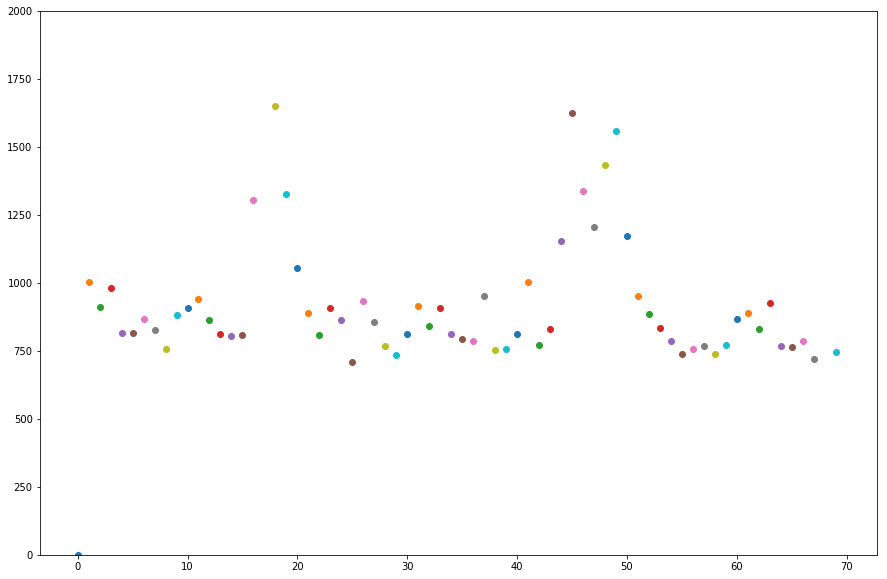

In [75]:
fig = plt.figure(figsize = (15,10))
for i, d in enumerate(diff):
    plt.scatter(i, d.max())
    # plt.plot(diff[:,i])
plt.ylim(0,2000)

In [ ]:
plt.imshow

In [95]:
from copy import copy

In [101]:
imgnp[:,18].shape

(70,)

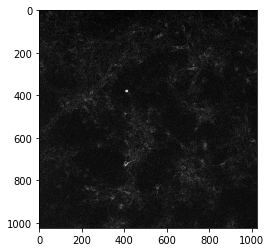

In [147]:
show_image(imgnp[0])

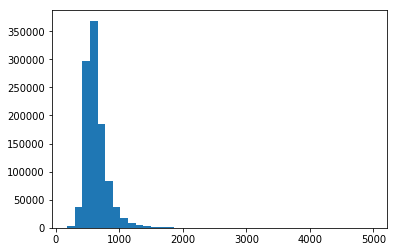

In [113]:
plt.hist(imgnp[17], bins=40);

In [144]:
cal = calibrate_video(imgnp)

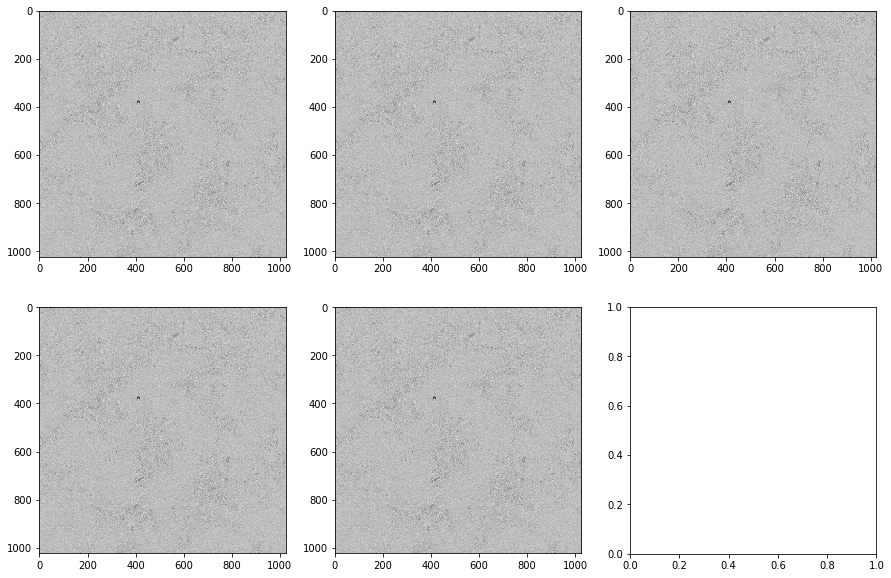

In [145]:
grid_view([im.reshape(1024,1024) for m in imgnp[:5]], cmap='gray');

array([[ -11.,   37., -130., ..., -148., -127.,  -69.],
       [-111.,  -57.,  -65., ..., -112., -157.,  -36.],
       [-128.,   -1.,  124., ...,  -90.,  -44.,  -44.],
       ...,
       [ -23.,  -74., -115., ...,  -96., -133.,  -90.],
       [ -55.,  101.,   60., ...,  -98.,  -60.,  -82.],
       [ -65., -104.,   20., ..., -141.,   30.,  -77.]])

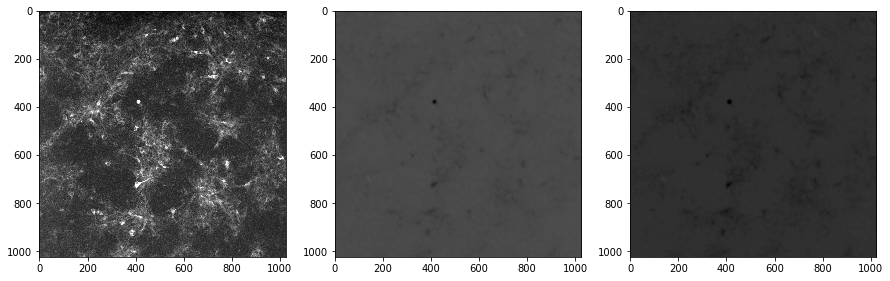

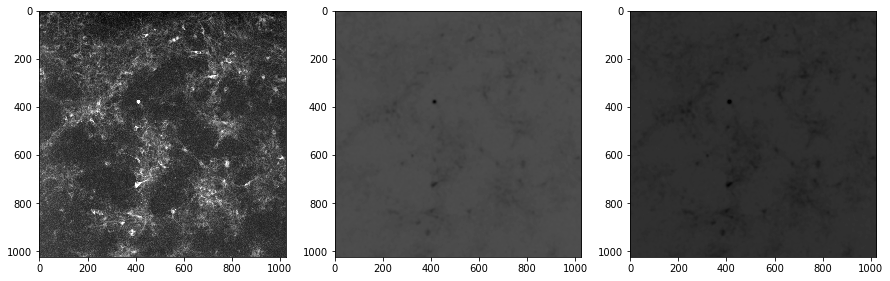

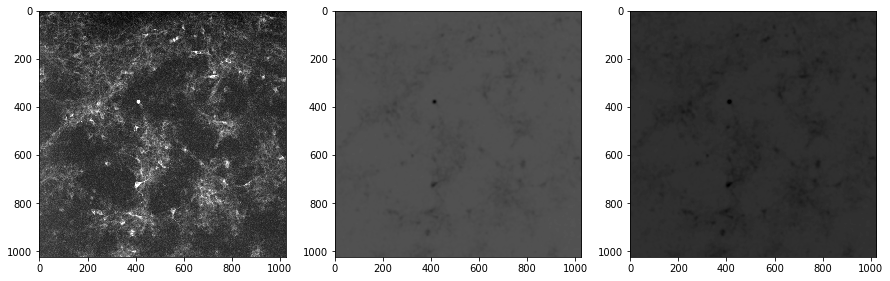

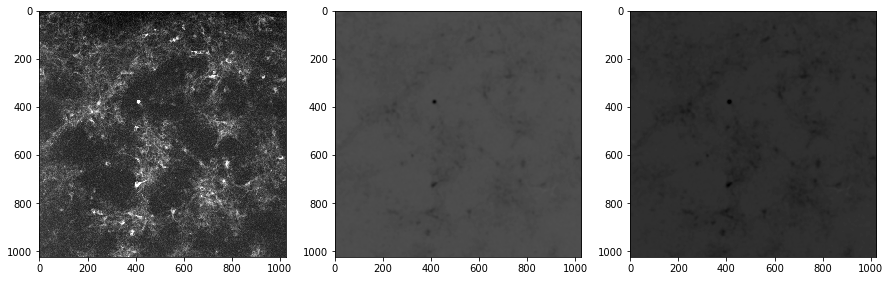

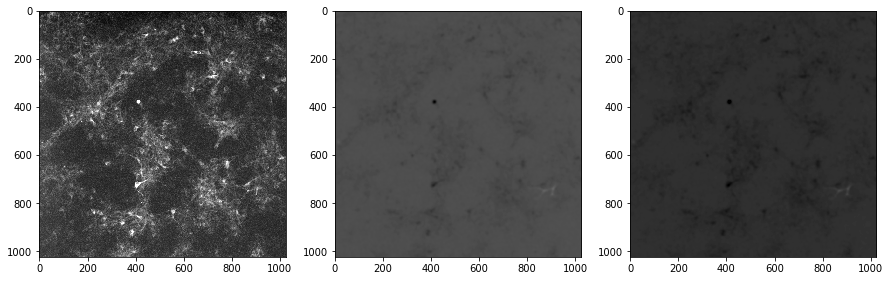

...

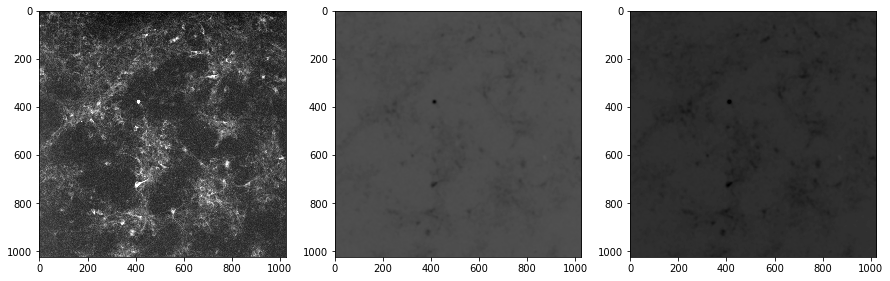

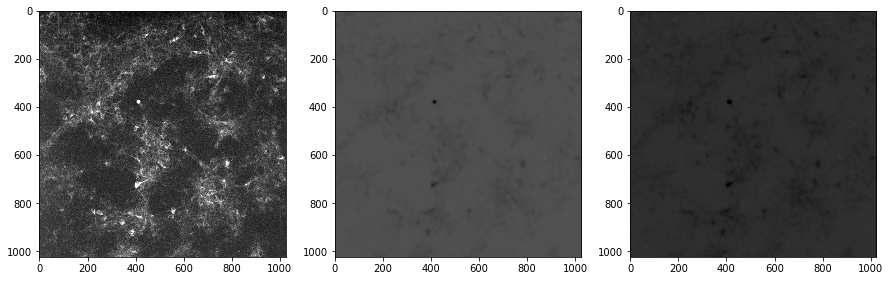

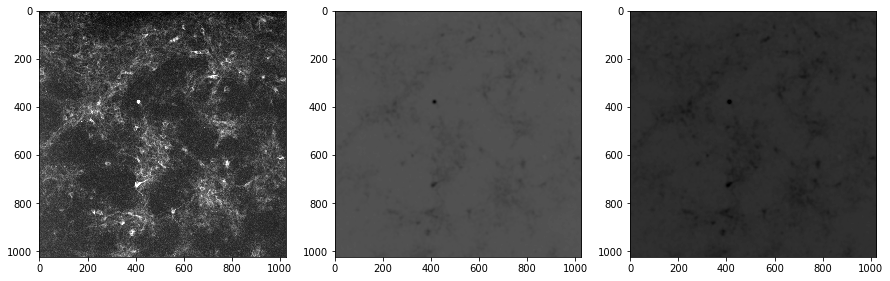

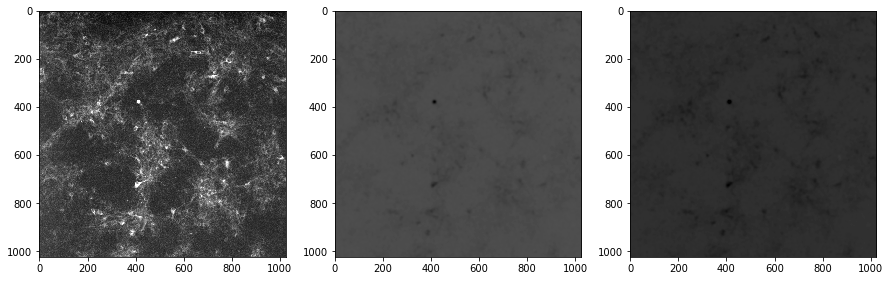

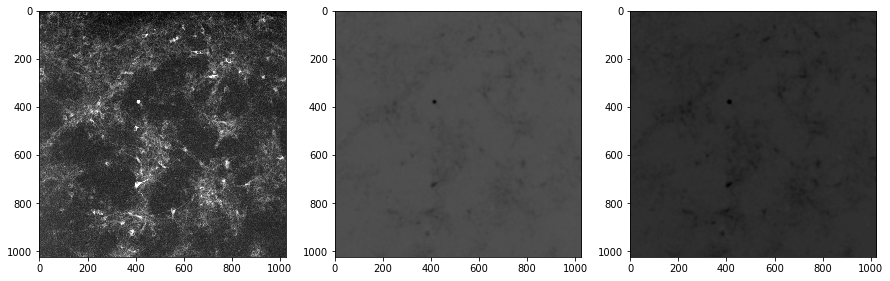

In [98]:
for i in range(40,60):
    im = diff[i].reshape(1024,1024)
    im_blur = ndimage.gaussian_filter(im, 4)
    # thresh = cv2.threshold(im_blur.astype('float32'), 2000, 1000, cv2.THRESH_TRUNC)[1]
    thresh = copy(im_blur)
    thresh[thresh < -500] = -500
    grid_view([imgnp[i].reshape(1024,1024), im_blur, thresh], cmap='gray', vmax=1800)

In [82]:
im_blur.max()

-26

In [89]:
# thresh = cv2.threshold(im_blur.astype('float32'), -400, 0, cv2.THRESH_BINARY)[1]

thresh.shape

(1024, 1024)

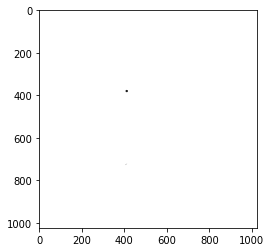

In [91]:
plt.imshow(thresh, cmap='gray')

In [69]:
cap = cv2.VideoCapture('GAERSDIV4_1_3.tif')

fgbg = cv2.createBackgroundSubtractorMOG2()

while(1):
    ret, frame = cap.read()

    fgmask = fgbg.apply(frame)

    cv2.imshow('frame',fgmask)
    k = cv2.waitKey(30) & 0xff
    if k == 27:
        break

cap.release()
cv2.destroyAllWindows()

error: OpenCV(3.4.1) /Users/travis/build/skvark/opencv-python/opencv/modules/highgui/src/window.cpp:356: error: (-215) size.width>0 && size.height>0 in function imshow


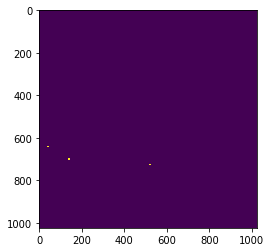

In [74]:
plt.imshow(image)

In [26]:
detector = cv2.SimpleBlobDetector()

In [75]:
# im = cv2.imread("2.jpg")

# Setup SimpleBlobDetector parameters.
params = cv2.SimpleBlobDetector_Params()

# Change thresholds
params.minThreshold = 10
params.maxThreshold = 200


# Filter by Area.
params.filterByArea = True
params.minArea = 1500

# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.1

# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.87

# Filter by Inertia
params.filterByInertia = True
params.minInertiaRatio = 0.01

# Create a detector with the parameters
detector = cv2.SimpleBlobDetector(params)


# Detect blobs.
keypoints = detector.detect(image)

# Draw detected blobs as red circles.
# cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS ensures
# the size of the circle corresponds to the size of blob

im_with_keypoints = cv2.drawKeypoints(im, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Show blobs
cv2.imshow("Keypoints", im_with_keypoints)
cv2.waitKey(0)

TypeError: Incorrect type of self (must be 'Feature2D' or its derivative)

In [77]:
detector = cv2.SimpleBlobDetector()
detector.detect(image.astype('float32'))

TypeError: Incorrect type of self (must be 'Feature2D' or its derivative)

In [45]:
import matplotlib.pyplot as plt

from skimage.restoration import (denoise_tv_chambolle, denoise_bilateral,
                                 denoise_wavelet, estimate_sigma)
from skimage import data, img_as_float
from skimage.util import random_noise


def test_denoising(image):
    original = image

    # Estimate the average noise standard deviation across color channels.
    sigma_est = estimate_sigma(original, multichannel=False, average_sigmas=True)
    # Due to clipping in random_noise, the estimate will be a bit smaller than the
    # specified sigma.
    print("Estimated Gaussian noise standard deviation = {}".format(sigma_est))


    sigma = 0.155
    %time tvchambolle = denoise_tv_chambolle(original, weight=0.1, multichannel=False)
    
    %time bilateral = denoise_bilateral(original, sigma_color=0.05, sigma_spatial=sigma_est, multichannel=False)
    
    %time wavelet = denoise_wavelet(original, multichannel=False)
    
    %time tvchambolle2 = denoise_tv_chambolle(original, weight=0.2, multichannel=False)
    
    # bilateral2 = denoise_bilateral(original, sigma_spatial=15, multichannel=False)
    # wavelet2 = denoise_wavelet(original, multichannel=False, convert2ycbcr=True)

    return tvchambolle, bilateral, wavelet, tvchambolle2

def plot_test_denoising(original, denoised):

    plt.gray()
    
    fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(18, 12),
                       sharex=True, sharey=True)
    
    ax[0, 0].imshow(original)
    ax[0, 0].axis('off')
    ax[0, 0].set_title('Original')

    ax[0, 1].imshow(tvchambolle)
    ax[0, 1].axis('off')
    ax[0, 1].set_title('TV')

    ax[0, 2].imshow(bilateral)
    ax[0, 2].axis('off')
    ax[0, 2].set_title('Bilateral')

    ax[0, 3].imshow(wavelet)
    ax[0, 3].axis('off')
    ax[0, 3].set_title('Wavelet denoising')

    ax[1, 1].imshow(tvchambolle2)
    ax[1, 1].axis('off')
    ax[1, 1].set_title('(more) TV')

    ax[1, 2].imshow(bilateral2)
    ax[1, 2].axis('off')
    ax[1, 2].set_title('(more) Bilateral')

    ax[1, 3].imshow(wavelet2)
    ax[1, 3].axis('off')
    ax[1, 3].set_title('Wavelet denoising\nin YCbCr colorspace')

    ax[1, 0].imshow(original)
    ax[1, 0].axis('off')
    ax[1, 0].set_title('Original')

    fig.tight_layout()

    # plt.show()
    
    return ax

In [ ]:
denoised = test_denoising(video[48])

Estimated Gaussian noise standard deviation = 71.08698257134888


In [ ]:
plot_test_denoising(denoised)

In [20]:
%time wavelet = denoise_wavelet(video[48], multichannel=False)

CPU times: user 222 ms, sys: 39.4 ms, total: 261 ms
Wall time: 182 ms


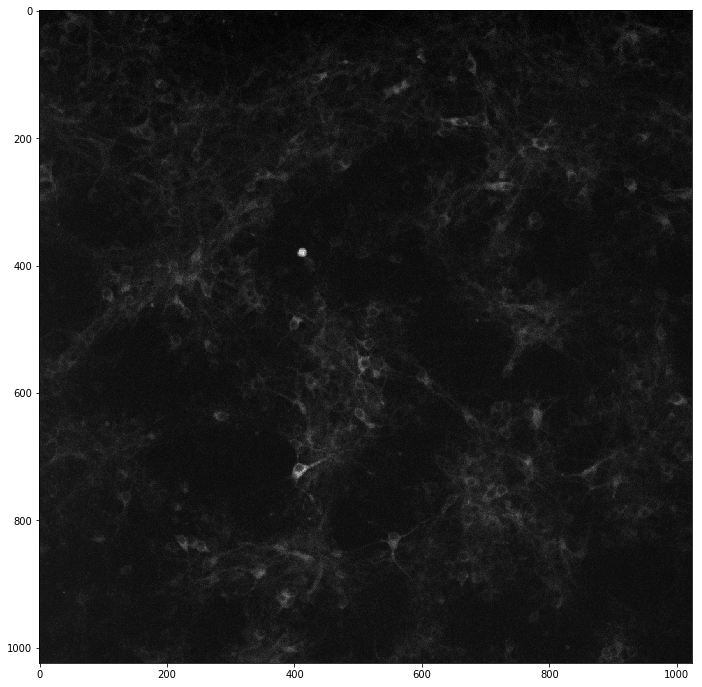

In [21]:
show_image(video[48])

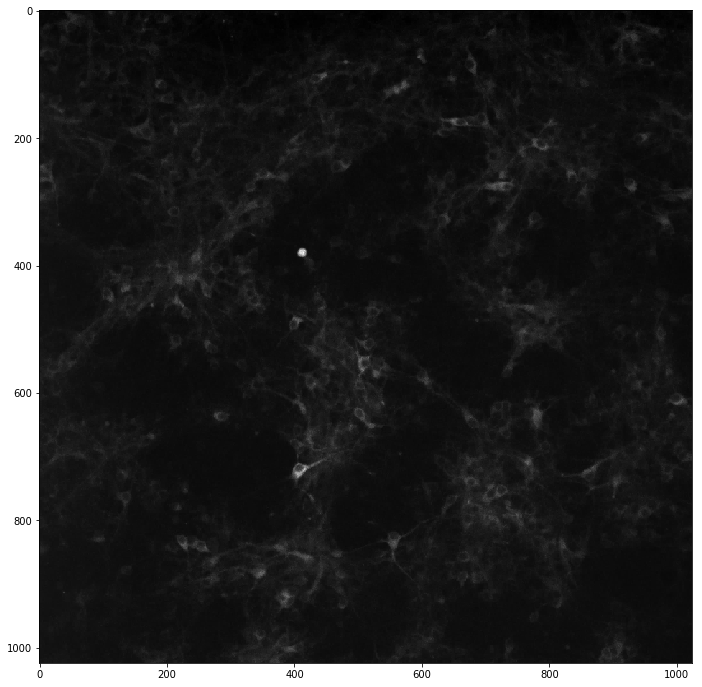

In [22]:
show_image(wavelet)

In [46]:
%time video_denoised = denoise_wavelet(video)

CPU times: user 16 s, sys: 7.24 s, total: 23.2 s
Wall time: 24.7 s


<IPython.core.display.Javascript object>


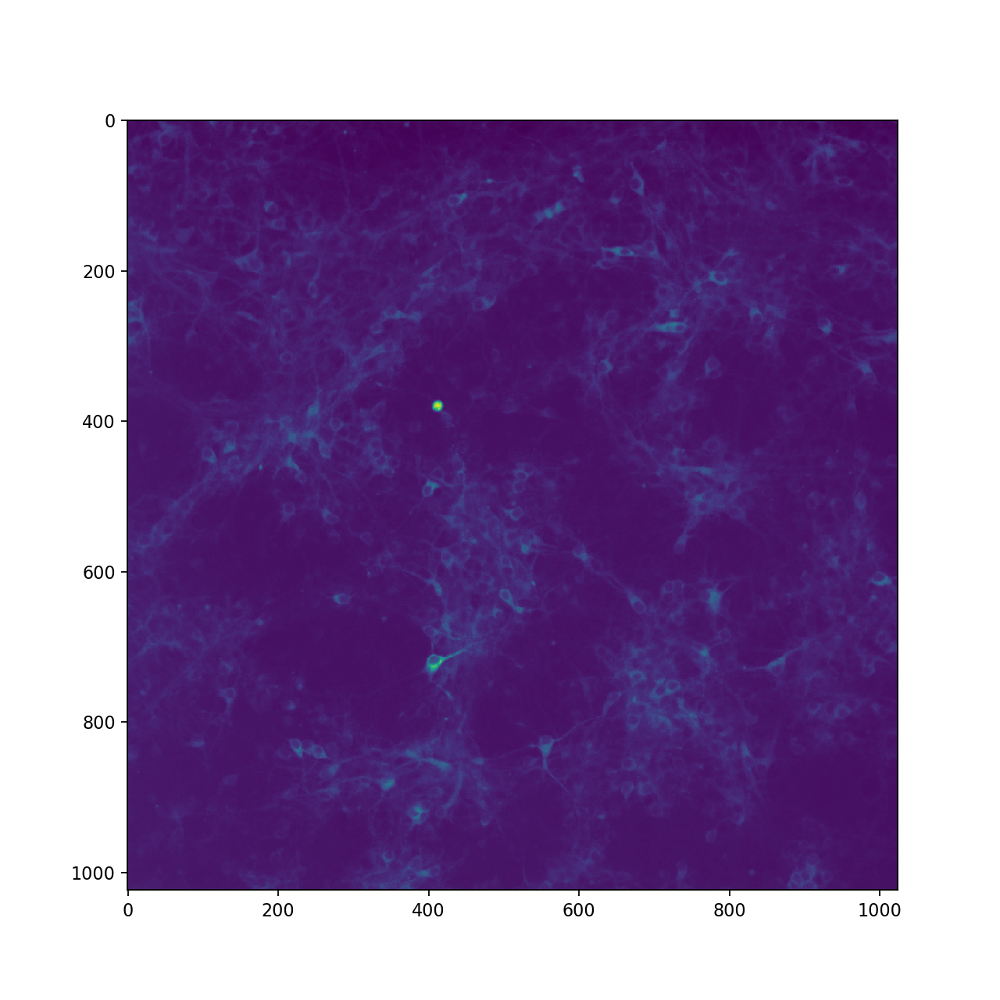

In [28]:
display_video(video_denoised)

In [45]:
diff_denoised = denoise_wavelet(diff, mode='hard')

<IPython.core.display.Javascript object>


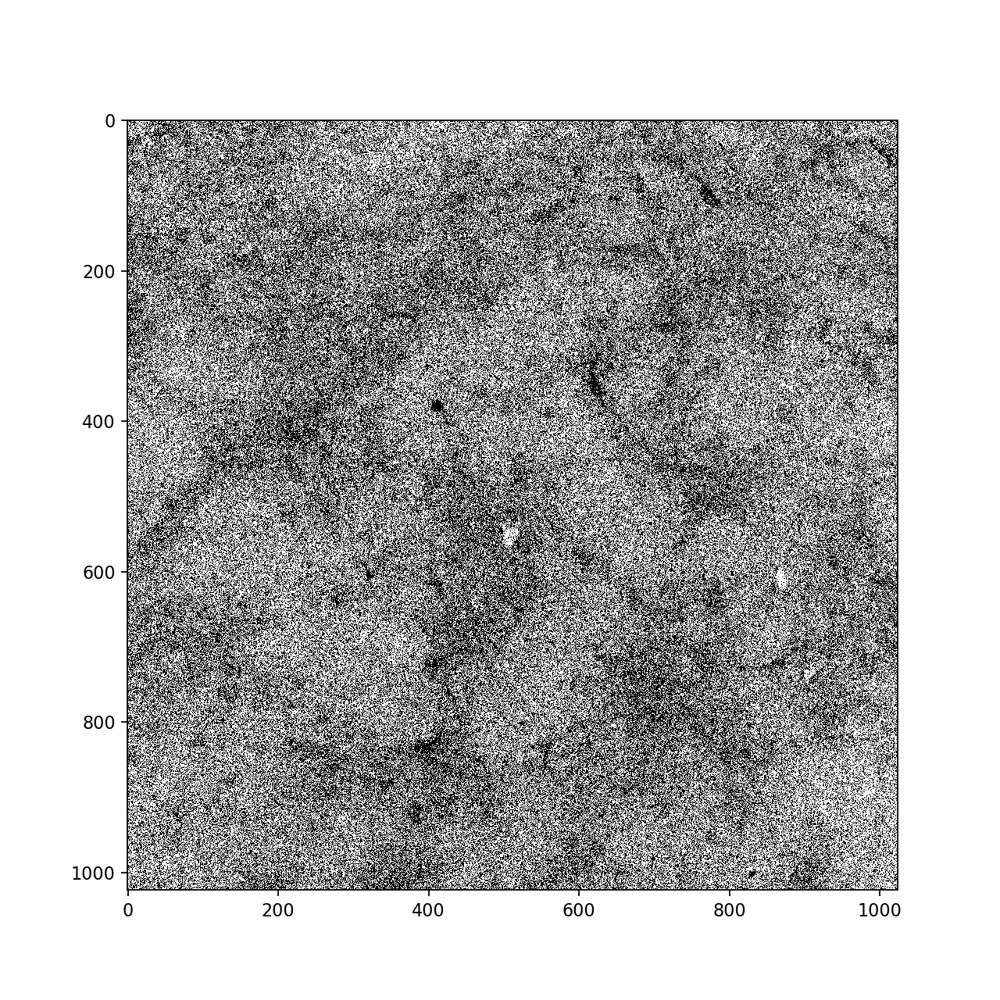

In [46]:
display_video(diff_denoised, cmap='gray')

In [47]:
diff_denoised = denoise_wavelet(diff)

Traceback (most recent call last):
  File "/Users/thomasvuillaume/anaconda/envs/school18/lib/python3.6/site-packages/matplotlib/cbook/__init__.py", line 388, in process
    proxy(*args, **kwargs)
  File "/Users/thomasvuillaume/anaconda/envs/school18/lib/python3.6/site-packages/matplotlib/cbook/__init__.py", line 228, in __call__
    return mtd(*args, **kwargs)
  File "/Users/thomasvuillaume/anaconda/envs/school18/lib/python3.6/site-packages/matplotlib/animation.py", line 1499, in _stop
    self.event_source.remove_callback(self._loop_delay)
AttributeError: 'NoneType' object has no attribute 'remove_callback'


<IPython.core.display.Javascript object>


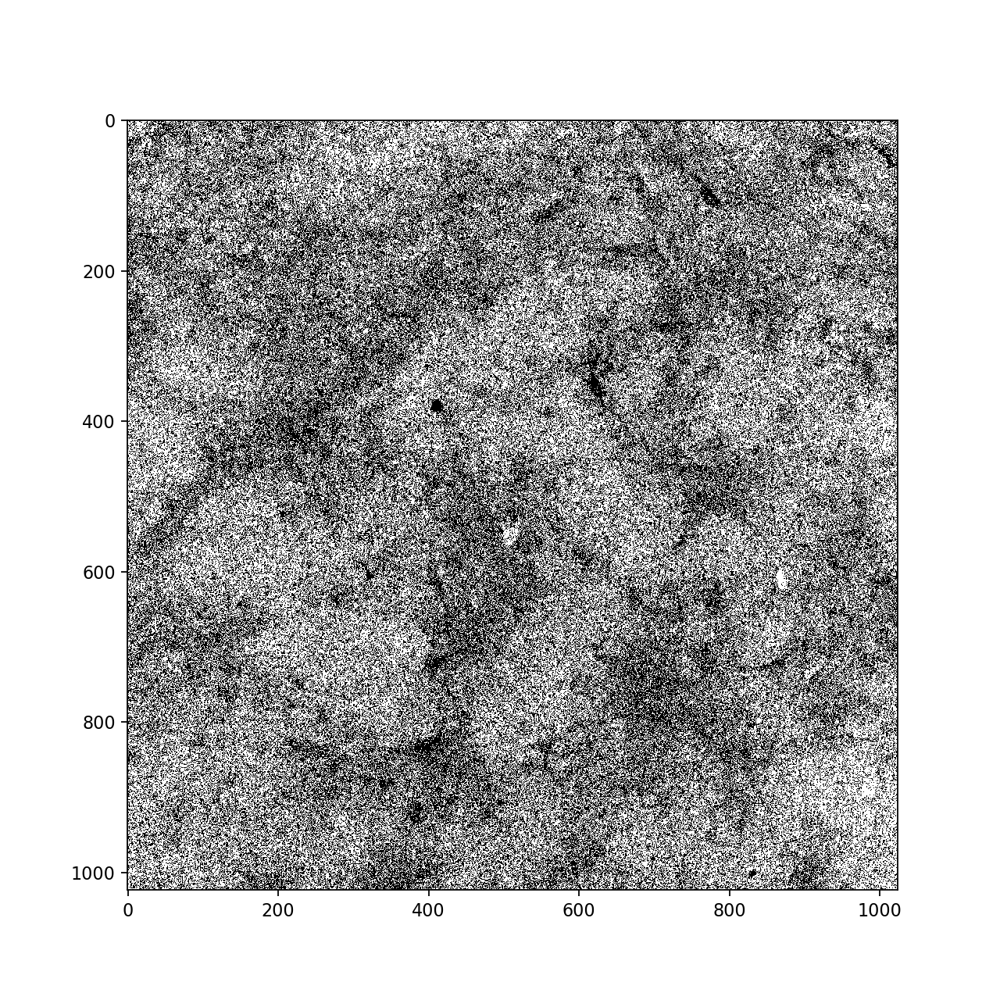

In [48]:
display_video(diff_denoised, cmap='gray')

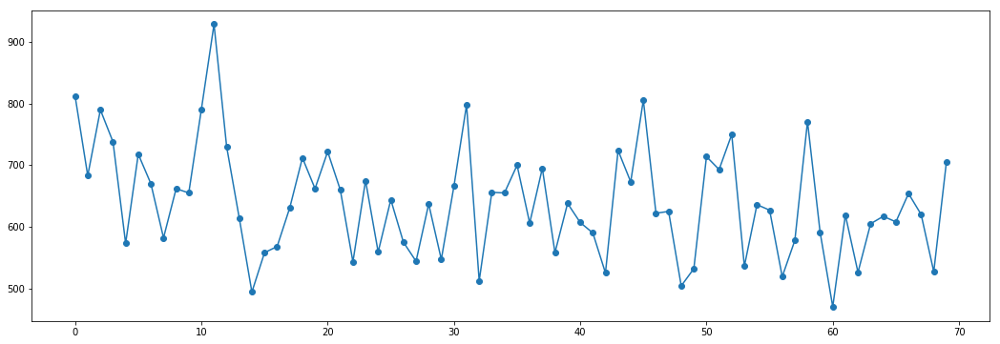

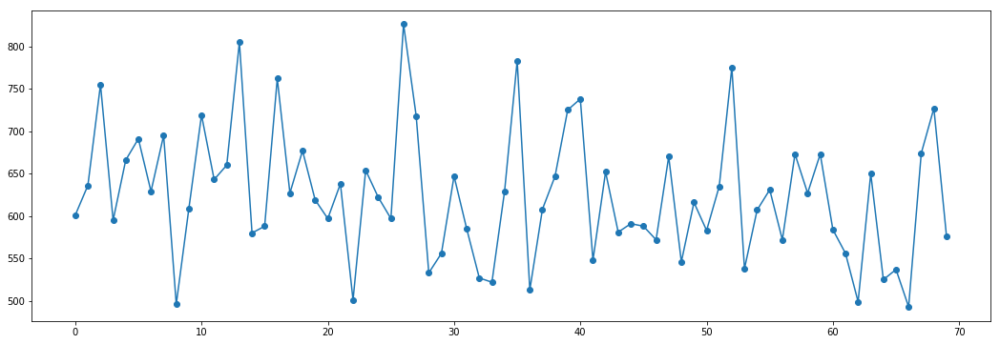

In [102]:
%matplotlib inline
plt.figure(figsize=(18,6))
plt.plot(video[:,506,562], 'o-')
plt.show()
plt.figure(figsize=(18,6))
plt.plot(video[:,507,562], 'o-')

In [104]:
mask.shape

(1024, 1024)

In [106]:
video2 = copy.copy(video)
video2[:,~mask.astype('bool')] = 0

<IPython.core.display.Javascript object>


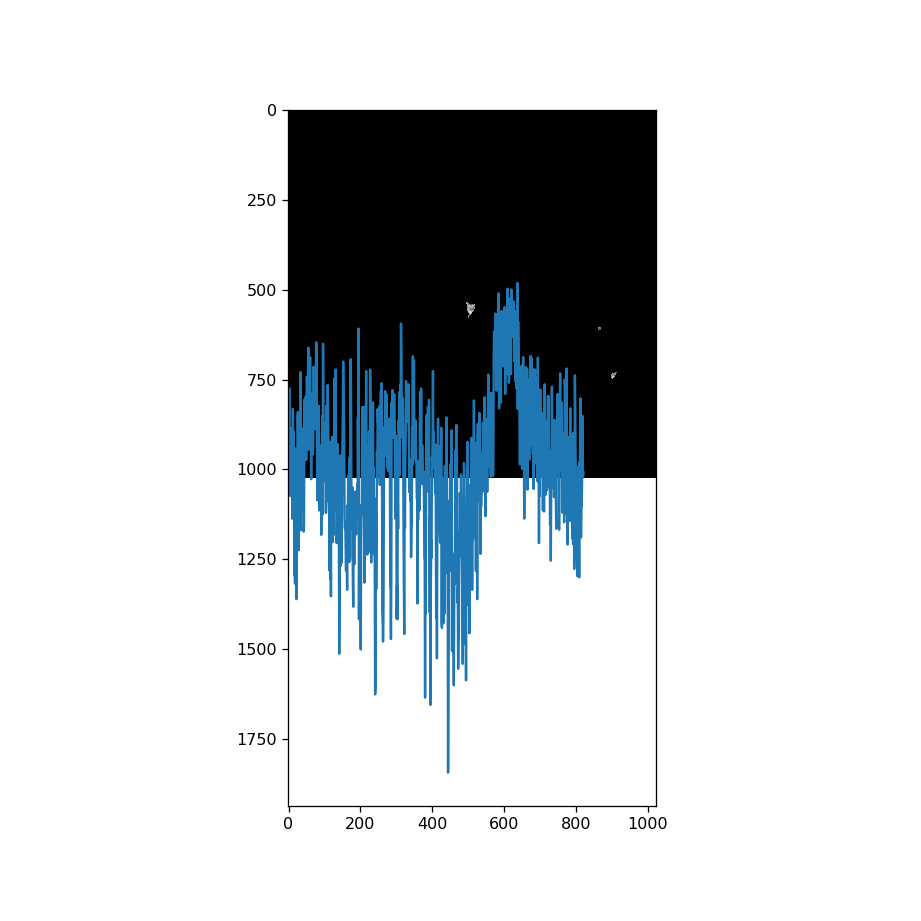

In [108]:
%matplotlib notebook
display_video(video2, cmap='gray')

<IPython.core.display.Javascript object>


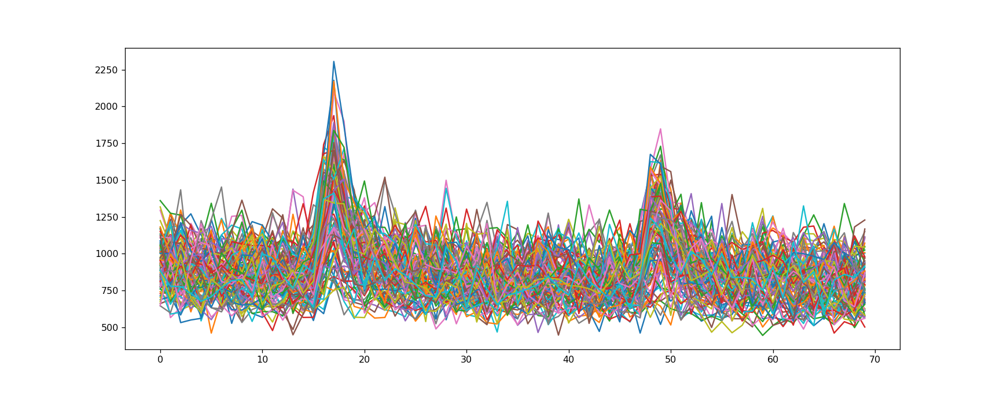

In [120]:
plt.figure(figsize=(15,6))
plt.plot(video2[:,mask.astype('bool')][:,:100]);

In [28]:
%matplotlib inline

In [21]:
from skimage import filters
filtered_video = filters.gaussian(video, 1)

In [22]:
diff = filtered_video[:,] - filtered_video[0]

In [23]:
diff.shape

(70, 1024, 1024)

In [24]:
fit = np.polyfit(np.arange(65), diff[5:].mean(axis=(1,2)), 1)
c = np.arange(70)*fit[0] + fit[1]

In [29]:
me = diff.mean(axis=(1,2))
md = np.median(diff, axis=(1,2))

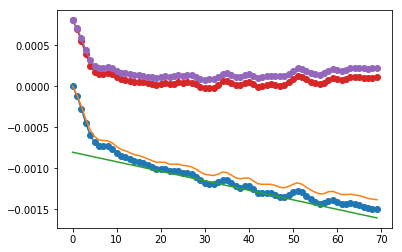

In [30]:
plt.plot(me, 'o-')
plt.plot(md)
plt.plot(c)
plt.plot(me - c, 'o-')
plt.plot(md - c, 'o-')

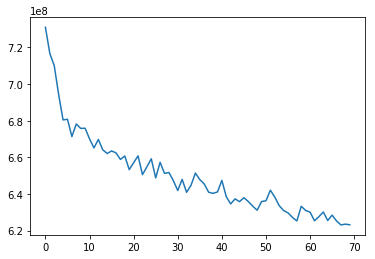

In [31]:
plt.plot(video.sum(axis=(1,2)) - video.mean(axis=(1,2)))

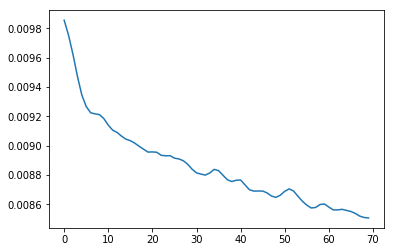

In [32]:
plt.plot(np.median(filtered_video, axis=(1,2)))

In [33]:
calibrated_video = filtered_video - np.median(filtered_video, axis=(1,2))[:,None,None]

In [34]:
diff_video = calibrated_video - calibrated_video[0]

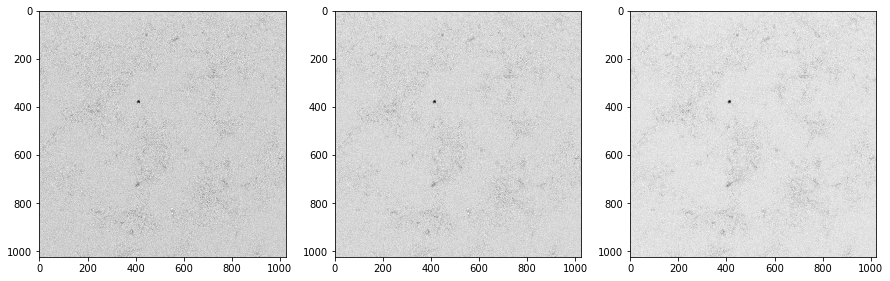

In [35]:
grid_view(diff_video[1:4], cmap='gray');

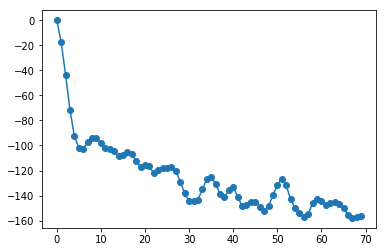

In [36]:
plt.plot(diff_video.sum(axis=(1,2)), 'o-');

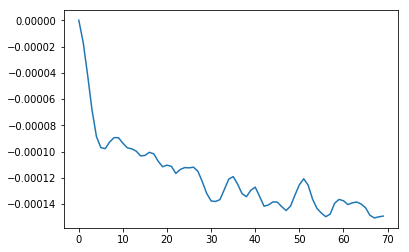

In [37]:
plt.plot(diff_video.mean(axis=(1,2)))

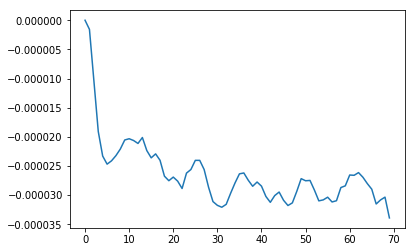

In [38]:
plt.plot(np.median(diff_video, axis=(1,2)))

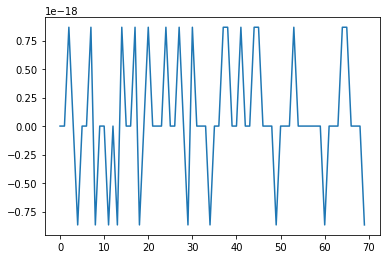

In [39]:
plt.plot(np.median(calibrated_video, axis=(1,2)))

In [42]:
def plot_frame_stat(video, stat=np.mean, ax=None, **kwargs):
    """
    Compute the stat (np.mean, np.median, np.sum...) of each frame 
    and plot the evolution in time
    """

    ax = plt.gca() if ax is None else ax
    
    if not 'label' in kwargs:
        kwargs['label'] = str(stat)

    ax.plot(list(map(stat,video)), **kwargs)
    ax.set_xlabel("Frame #")
    ax.legend()

    return ax


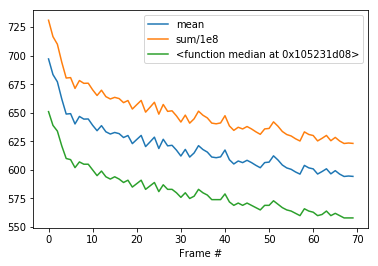

In [43]:
ax = plot_frame_stat(video, label="mean")
ax = plot_frame_stat(video,(lambda x: np.sum(x)/1e6), ax, label="sum/1e8")
ax = plot_frame_stat(video, np.median, ax)

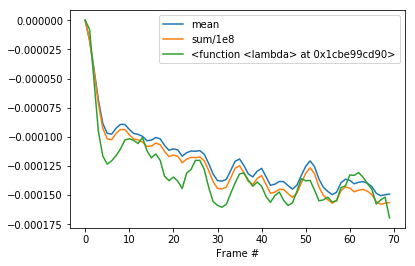

In [44]:
ax = plot_frame_stat(diff_video, label="mean")
ax = plot_frame_stat(diff_video,(lambda x: np.sum(x)/1e6), ax, label="sum/1e8")
ax = plot_frame_stat(diff_video, (lambda x: np.median(x)*5), ax)

In [46]:
from skimage.restoration import denoise_wavelet

In [47]:
denoised_video = denoise_wavelet(diff_video)

In [48]:
from skimage.filters import threshold_otsu, threshold_adaptive

In [72]:
image = denoised_video[48]

<IPython.core.display.Javascript object>


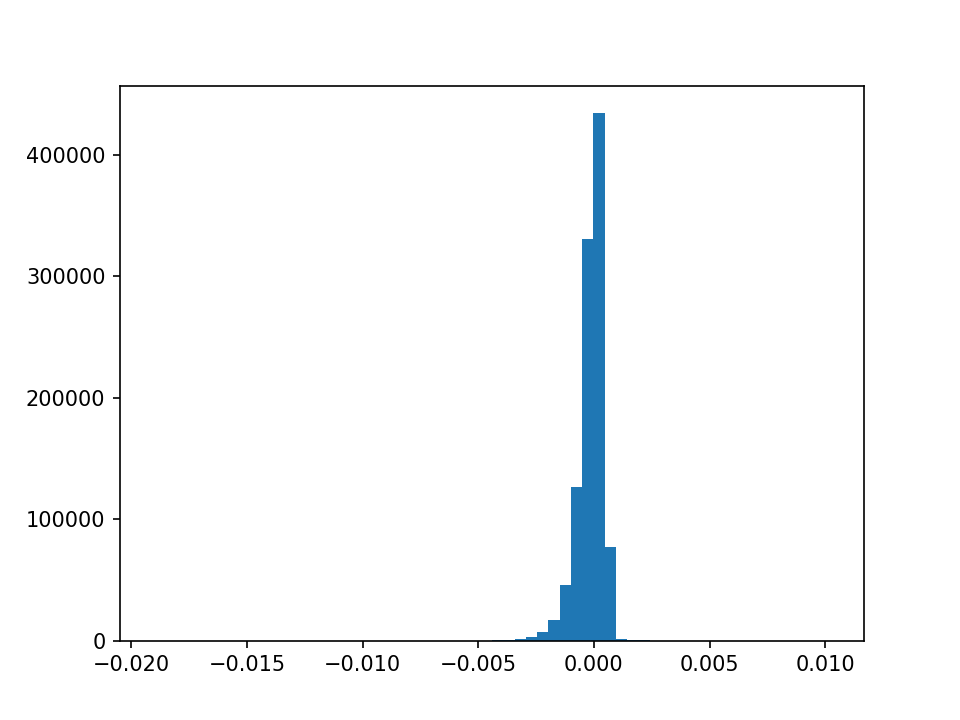

In [73]:
plt.hist(image.flatten(), bins=60);

0.0005307480225929407


/Users/thomasvuillaume/anaconda/envs/school18/lib/python3.6/site-packages/skimage/filters/thresholding.py:221: skimage_deprecation: Function ``threshold_adaptive`` is deprecated and will be removed in version 0.15. Use ``threshold_local`` instead.
  def threshold_adaptive(image, block_size, method='gaussian', offset=0,
/Users/thomasvuillaume/anaconda/envs/school18/lib/python3.6/site-packages/skimage/filters/thresholding.py:223: UserWarning: The return value of `threshold_local` is a threshold image, while `threshold_adaptive` returned the *thresholded* image.
  warn('The return value of `threshold_local` is a threshold image, while '


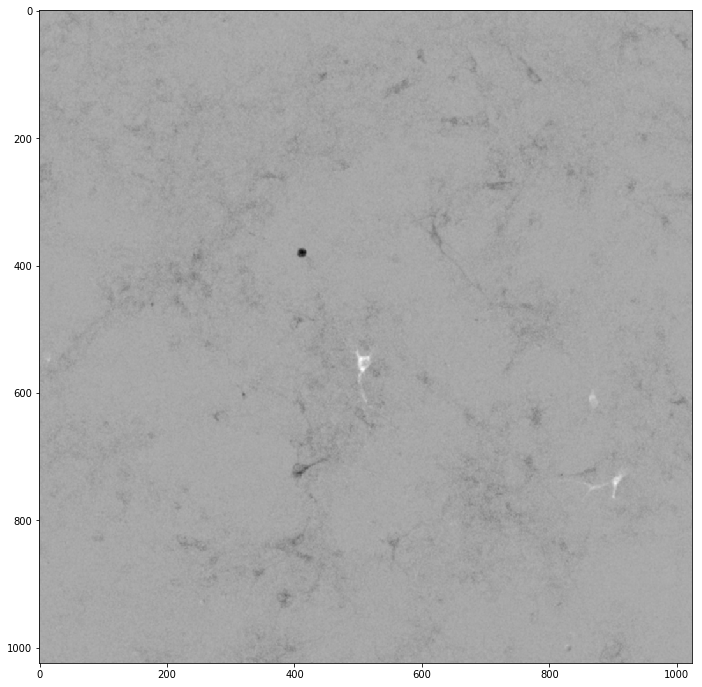

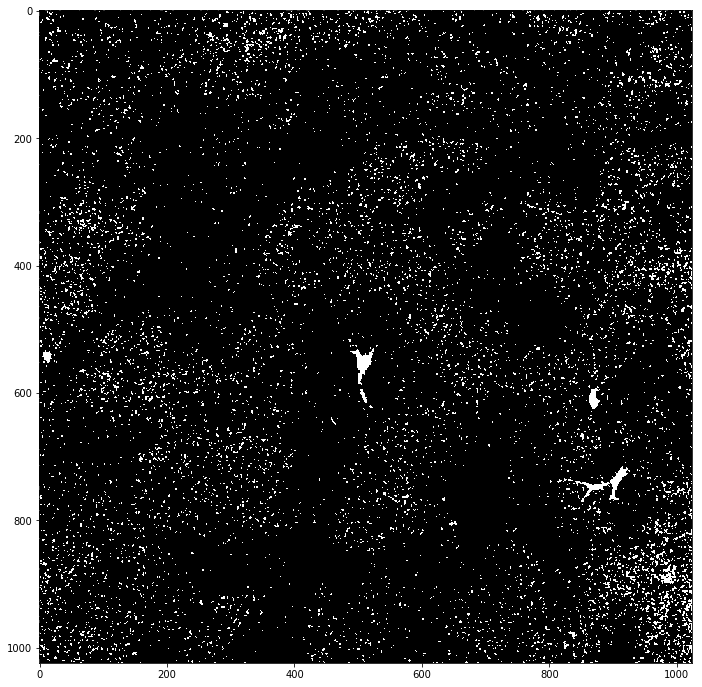

In [80]:
%matplotlib inline
# global_thresh = threshold_otsu(image, nbins=int(0.99*1024**2))
global_thresh = np.percentile(image,95)
print(global_thresh)
binary_global = image > global_thresh

block_size = 3
binary_adaptive = threshold_adaptive(image, block_size, offset=10)

show_image(image)
plt.show()
show_image(binary_global)

In [53]:
from skimage.feature import blob_dog, blob_doh, blob_log
blob_dog(image, min_sigma=1, max_sigma=50, sigma_ratio=1.6, threshold=2.0, overlap=0.5)

array([], shape=(0, 3), dtype=float64)

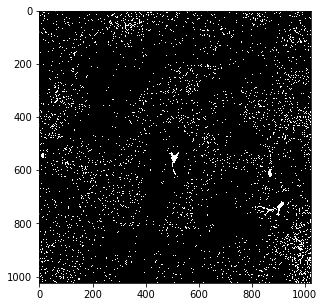

In [133]:
image = binary_global[48]
show_image(image, figsize=(5,5))

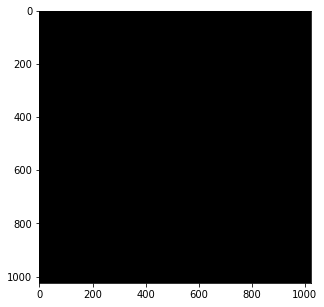

In [144]:
from skimage.restoration import denoise_tv_chambolle, denoise_bilateral
from skimage import morphology as m
image = np.array([m.binary_erosion(frame) for frame in denoised_video])
image = m.binary_erosion(image)
image = m.binary_dilation(image)
# image = m.binary_erosion(image)
# image = m.binary_dilation(image)
# image = m.binary_erosion(image)
# image = m.binary_dilation(image)
# image = m.binary_erosion(image)
# image = m.binary_dilation(image)
# image = denoise_bilateral(image, multichannel=False)
show_image(image[48], figsize=(5,5))

In [142]:
blob = blob_doh(image, min_sigma=10, max_sigma=60)
blob

array([[747.        , 865.        ,  10.        ],
       [733.        , 909.        ,  21.11111111],
       [613.        , 868.        ,  10.        ],
       [548.        , 506.        ,  15.55555556],
       [542.        ,  12.        ,  10.        ]])

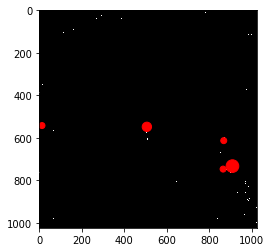

In [143]:
%matplotlib inline
circles = []
fig, ax = plt.subplots()
ax.imshow(image, cmap='gray')
for b in blob:    
    circle = (plt.Circle((b[1], b[0]), np.sqrt(2) * b[2], color='r'))
    ax.add_artist(circle)

In [ ]:
plt.Circle

In [160]:
blob_doh(image)

array([], shape=(0, 3), dtype=float64)

In [161]:
blob_log(image)

array([], shape=(0, 3), dtype=float64)

In [81]:
global_thresh = np.array(list(map((lambda x: np.percentile(x.flatten(), 95)), denoised_video)))
# global_thresh = np.array([np.percentile(image) for image in video ])

In [84]:
binary_global = denoised_video > global_thresh[:,None,None]

<IPython.core.display.Javascript object>


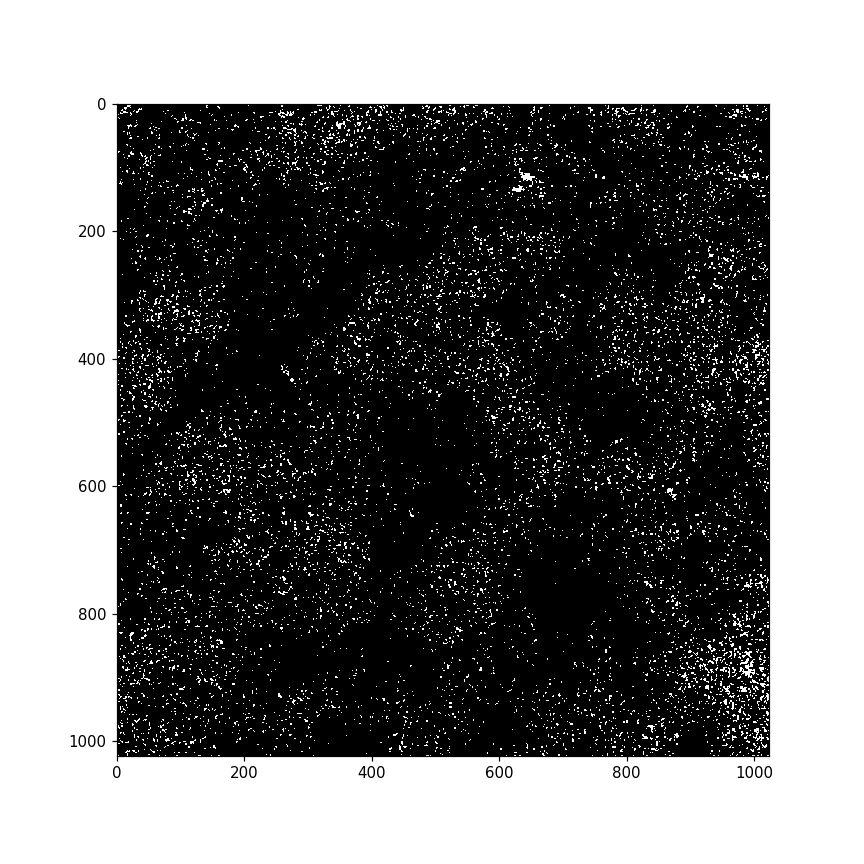

In [86]:
display_video(binary_global, cmap='gray')